# Make figure 6 of the paper

In [130]:
import pandas as pd
import pygmt 
from pyproj import Transformer
import matplotlib.pyplot as plt

import numpy as np

In [135]:
df = pd.read_csv('../data/datasets_all_regions/origin_2010_2015_reloc_cog_morton_ver3.csv',index_col=0)
df


,lat,lon,depth,time,orid,nass,p_picks,s_picks,rms,nsphz,gap,algorithm,id_Morton,dist,dt,NonDimDist
0,47.22533,-122.16895,56.111,1.262305e+09,0,7,2,5,1.081,5.0,235.831208,genie,0,0.753784,4.933721e+07,411143.414481
1,48.19518,-121.77276,3.820,1.262305e+09,1,55,25,30,0.985,30.0,201.698107,genie,0,1.333054,4.933712e+07,411142.646872
2,47.86208,-122.09903,17.799,1.262330e+09,2,28,10,18,0.784,18.0,181.023074,genie,0,0.957326,4.931184e+07,410932.027590
3,47.96435,-122.91906,21.286,1.262336e+09,3,20,10,10,0.465,10.0,150.528010,genie,0,0.684951,4.930621e+07,410885.088574
4,45.87262,-122.19180,9.822,1.262362e+09,4,39,20,19,0.657,19.0,237.324295,genie,0,1.627692,4.927976e+07,410664.693011
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
63882,40.59439,-124.42438,19.741,1.435097e+09,63882,23,9,14,1.015,14.0,73.959960,genie,4408,0.112501,7.919735e+03,65.997794
63883,40.54636,-127.10076,26.165,1.435100e+09,63883,12,1,11,0.744,11.0,223.080984,genie,4408,2.139193,9.995899e+03,83.299204
63884,49.74167,-124.58578,5.274,1.435101e+09,63884,13,7,6,0.894,6.0,197.904075,genie,4408,9.188393,1.107364e+04,92.281049
63885,40.64363,-125.36531,1.891,1.435101e+09,63885,8,3,5,0.982,5.0,145.748415,genie,4408,0.824720,1.158579e+04,96.548245


In [136]:
_df = df[(df.rms < 2.5) & (df.p_picks > 4) & (df.s_picks > 4)].sort_values('nass', ascending=True)


## Entire Region

/tmp/ipykernel_1122595/4064612463.py:31: FutureWarning: The 'color' parameter has been deprecated since v0.8.0 and will be removed in v0.12.0. Please use 'fill' instead.
  fig.plot(x=[-110], y=[48], style="c0.07c", color="white", label="Catalog Event", pen="0.2p,black")
/tmp/ipykernel_1122595/4064612463.py:33: FutureWarning: The 'color' parameter has been deprecated since v0.8.0 and will be removed in v0.12.0. Please use 'fill' instead.
  fig.plot(


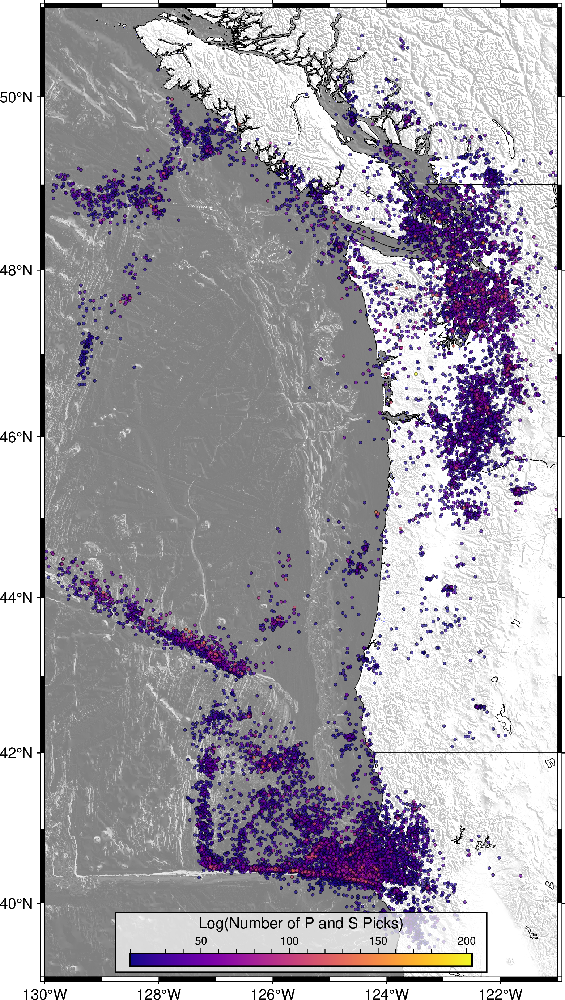

In [126]:


# Initialize the figure
fig = pygmt.Figure()

# Define target region
min_lat = 39
max_lat = 51
min_lon = -130
max_lon = -121

# Define the region to plot
region = [min_lon, max_lon, min_lat, max_lat]
title = "(b)"

# Load grid data
grid = pygmt.datasets.load_earth_relief(resolution="15s", region=[min_lon, max_lon, min_lat, max_lat])
shade = pygmt.grdgradient(grid=grid, azimuth="0/90", normalize="t1")

# Set up the base map
fig.basemap(region=region, projection="M12c", frame="af")

fig.grdimage(grid=grid, cmap="blue", shading=shade, transparency=50)
fig.coast(region=region, projection="M12c", shorelines=True, borders=[1, 2], resolution="f")

# Apply logarithmic scale for color mapping
# Apply log10 transformation to nass values and set color palette
nass_log_min = _df['nass'].min()   # Add 1 to avoid log(0) error
nass_log_max = _df['nass'].max() 
pygmt.makecpt(cmap="plasma", series=[nass_log_min, nass_log_max])

# Plot a dummy point to add the station legend
fig.plot(x=[-110], y=[48], style="c0.07c", color="white", label="Catalog Event", pen="0.2p,black")
# Plot the stations with the color map applied to the logarithm of "nass"
fig.plot(
    x=_df["lon"],
    y=_df["lat"],
    style="c0.07c",
    color=_df["nass"] ,  # Apply log transformation for color mapping
    cmap=True,
    pen="0.1p,black",
    transparency=30
)

# Add title text
fig.colorbar(
    position="jBC+o0.0c/0.25c+h+w8c/0.3c+ml",
    box="+gwhite@30+p0.8p,black",
    frame=["x+lLog(Number of P and S Picks)"],
)
# Save the figure
fig.savefig("../data/datasets_all_regions/all_catalog_events_2010_2015_ver3_nass_log.pdf")

# Display the figure
fig.show()


## Axial and Endeavor


plot [WARNING]: Mismatch between actual (1) and expected (2) fields near line 1684 in file PB2002_boundaries.dig
plot [WARNING]: Mismatch between actual (1) and expected (2) fields near line 5086 in file PB2002_boundaries.dig
plot [WARNING]: Mismatch between actual (1) and expected (2) fields near line 5113 in file PB2002_boundaries.dig
plot [WARNING]: Your data array row 17 contains NaNs - no resampling taken place!
/tmp/ipykernel_1122595/796156149.py:36: FutureWarning: The 'color' parameter has been deprecated since v0.8.0 and will be removed in v0.12.0. Please use 'fill' instead.
  fig.plot(
/tmp/ipykernel_1122595/796156149.py:46: FutureWarning: The 'color' parameter has been deprecated since v0.8.0 and will be removed in v0.12.0. Please use 'fill' instead.
  fig.plot(x=[-110], y=[48], style="c0.12c", color="white", label="Catalog Event", pen="0.2p,black")


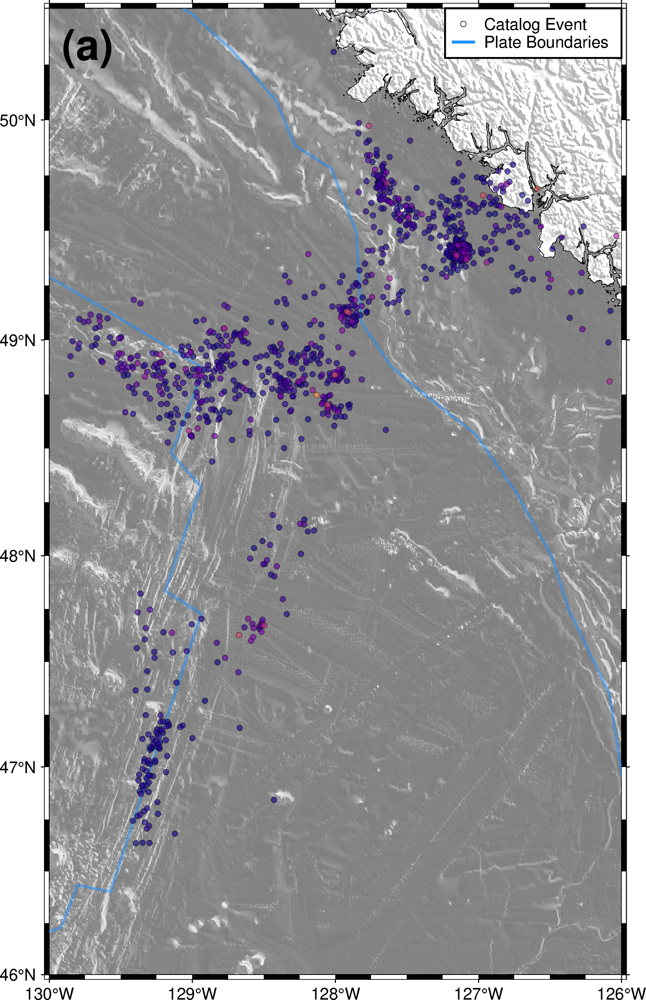

In [181]:


# Initialize the figure
fig = pygmt.Figure()

# Define target region
min_lat = 46
max_lat = 50.5
min_lon = -130
max_lon = -126

# Define the region to plot
region = [min_lon, max_lon, min_lat, max_lat]
title = "(b)"


# Load grid data
grid = pygmt.datasets.load_earth_relief(resolution="15s", region=[min_lon, max_lon, min_lat, max_lat])
shade = pygmt.grdgradient(grid=grid, azimuth="0/90", normalize="t1")

# Set up the base map
fig.basemap(region=region, projection="M12c", frame="af")

fig.grdimage(grid=grid, cmap="blue", shading=shade, transparency=50)
fig.coast(region=region, projection="M12c", shorelines=True, borders=[1, 2], resolution="f")

# Add plate boundaries 
fig.plot(data="PB2002_boundaries.dig", pen="1.5p,dodgerblue1", transparency=50)

# Apply logarithmic scale for color mapping
# Apply log10 transformation to nass values and set color palette
nass_log_min = _df['nass'].min()  # Add 1 to avoid log(0) error
nass_log_max = _df['nass'].max()
pygmt.makecpt(cmap="plasma", series=[nass_log_min, nass_log_max])
title = "(a)"

# Plot the stations with the color map applied to the logarithm of "nass"
fig.plot(
    x=_df["lon"],
    y=_df["lat"],
    style="c0.12c",
    color=_df["nass"],  # Apply log transformation for color mapping
    cmap=True,
    pen="0.1p,black",
    transparency=35
)
# Plot a dummy objects for the legend
fig.plot(x=[-110], y=[48], style="c0.12c", color="white", label="Catalog Event", pen="0.2p,black")

fig.plot(
        x=[120, +120],
        y=[-30, -30],
        pen="1.5p,dodgerblue1",label='Plate Boundaries'
    )

# Position the text 1.5 cm from the top left corner
fig.text(
    x=min_lon + (max_lon - min_lon) * (1 / 15),  # Adjust x based on 1.5 cm from left
    y=max_lat - (max_lat - min_lat) * (1 / 28),  # Adjust y based on 1.5 cm from top
    text=title,
    font="25p,Helvetica-Bold,black",
    no_clip=True
)

# # Add title text
# fig.colorbar(
#     position="jBC+o0.0c/0.25c+h+w8c/0.3c+ml",
#     box="+gwhite@30+p0.8p,black",
#     frame=["x+lNumber of P and S Picks"],
# )

# Add the legend to the plot
fig.legend(position="JTR+w3.7+jTR", box='+gwhite+p1p')
# Save the figure
fig.savefig("../data/datasets_all_regions/axial_endeavor_events_2010_2015_ver3_nass_no_relief.png")

# Display the figure
fig.show()


## Mendicino


plot [WARNING]: Mismatch between actual (1) and expected (2) fields near line 1684 in file PB2002_boundaries.dig
plot [WARNING]: Mismatch between actual (1) and expected (2) fields near line 5086 in file PB2002_boundaries.dig
plot [WARNING]: Mismatch between actual (1) and expected (2) fields near line 5113 in file PB2002_boundaries.dig
plot [WARNING]: Your data array row 17 contains NaNs - no resampling taken place!
/tmp/ipykernel_1122595/2791366654.py:36: FutureWarning: The 'color' parameter has been deprecated since v0.8.0 and will be removed in v0.12.0. Please use 'fill' instead.
  fig.plot(
/tmp/ipykernel_1122595/2791366654.py:46: FutureWarning: The 'color' parameter has been deprecated since v0.8.0 and will be removed in v0.12.0. Please use 'fill' instead.
  fig.plot(x=[-110], y=[48], style="c0.12c", color="white", label="Catalog Event", pen="0.2p,black")


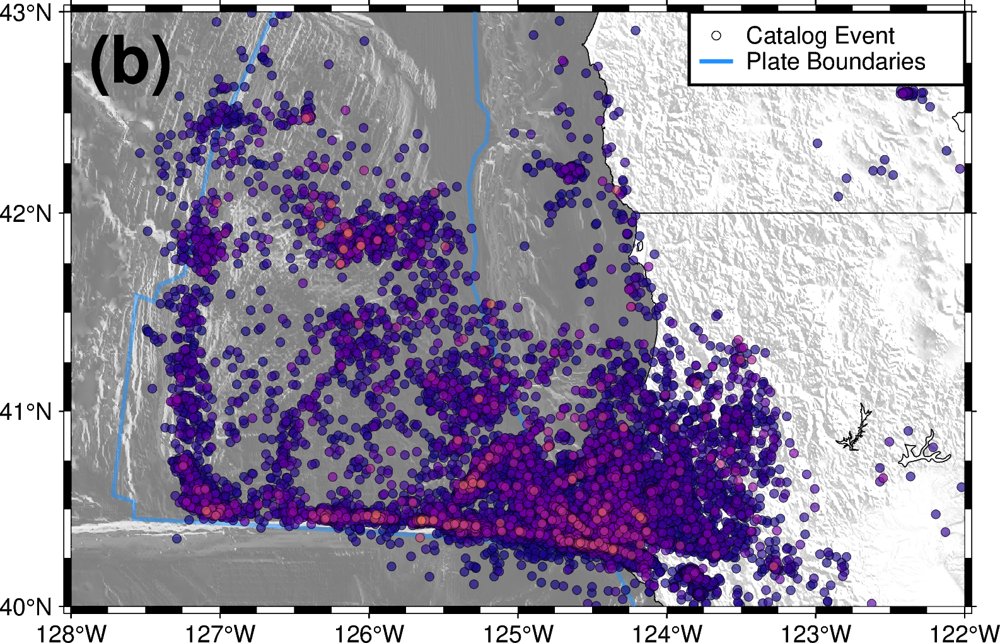

In [182]:


# Initialize the figure
fig = pygmt.Figure()

# Define target region
min_lat = 40
max_lat = 43
min_lon = -128
max_lon = -122

# Define the region to plot
region = [min_lon, max_lon, min_lat, max_lat]
title = "(b)"


# Load grid data
grid = pygmt.datasets.load_earth_relief(resolution="15s", region=[min_lon, max_lon, min_lat, max_lat])
shade = pygmt.grdgradient(grid=grid, azimuth="0/90", normalize="t1")

# Set up the base map
fig.basemap(region=region, projection="M12c", frame="af")

fig.grdimage(grid=grid, cmap="blue", shading=shade, transparency=50)
fig.coast(region=region, projection="M12c", shorelines=True, borders=[1, 2], resolution="f")

# Add plate boundaries 
fig.plot(data="PB2002_boundaries.dig", pen="1.5p,dodgerblue1", transparency=50)

# Apply logarithmic scale for color mapping
# Apply log10 transformation to nass values and set color palette
nass_log_min = _df['nass'].min()  # Add 1 to avoid log(0) error
nass_log_max = _df['nass'].max()
pygmt.makecpt(cmap="plasma", series=[nass_log_min, nass_log_max])
title = "(b)"

# Plot the stations with the color map applied to the logarithm of "nass"
fig.plot(
    x=_df["lon"],
    y=_df["lat"],
    style="c0.12c",
    color=_df["nass"],  # Apply log transformation for color mapping
    cmap=True,
    pen="0.1p,black",
    transparency=35
)
# Plot a dummy objects for the legend
fig.plot(x=[-110], y=[48], style="c0.12c", color="white", label="Catalog Event", pen="0.2p,black")

fig.plot(
        x=[120, +120],
        y=[-30, -30],
        pen="1.5p,dodgerblue1",label='Plate Boundaries'
    )

# Position the text 1.5 cm from the top left corner
fig.text(
    x=min_lon + (max_lon - min_lon) * (1 / 15),  # Adjust x based on 1.5 cm from left
    y=max_lat - (max_lat - min_lat) * (1 / 13),  # Adjust y based on 1.5 cm from top
    text=title,
    font="25p,Helvetica-Bold,black",
    no_clip=True
)

# # Add title text
# fig.colorbar(
#     position="jBC+o0.0c/0.25c+h+w8c/0.3c+ml",
#     box="+gwhite@30+p0.8p,black",
#     frame=["x+lNumber of P and S Picks"],
# )

# Add the legend to the plot
fig.legend(position="JTR+w3.7+jTR", box='+gwhite+p1p')
# Save the figure
fig.savefig("../data/datasets_all_regions/mendocino_events_2010_2015_ver3_nass_no_relief.png")

# Display the figure
fig.show()


plot [WARNING]: Mismatch between actual (1) and expected (2) fields near line 1684 in file PB2002_boundaries.dig
plot [WARNING]: Mismatch between actual (1) and expected (2) fields near line 5086 in file PB2002_boundaries.dig
plot [WARNING]: Mismatch between actual (1) and expected (2) fields near line 5113 in file PB2002_boundaries.dig
plot [WARNING]: Your data array row 17 contains NaNs - no resampling taken place!
/tmp/ipykernel_1122595/3420424612.py:37: FutureWarning: The 'color' parameter has been deprecated since v0.8.0 and will be removed in v0.12.0. Please use 'fill' instead.
  fig.plot(
/tmp/ipykernel_1122595/3420424612.py:47: FutureWarning: The 'color' parameter has been deprecated since v0.8.0 and will be removed in v0.12.0. Please use 'fill' instead.
  fig.plot(x=[-110], y=[48], style="c0.12c", color="white", label="Catalog Event", pen="0.2p,black")
text [WARNING]: Skipped 1 records as blank - please check input data.


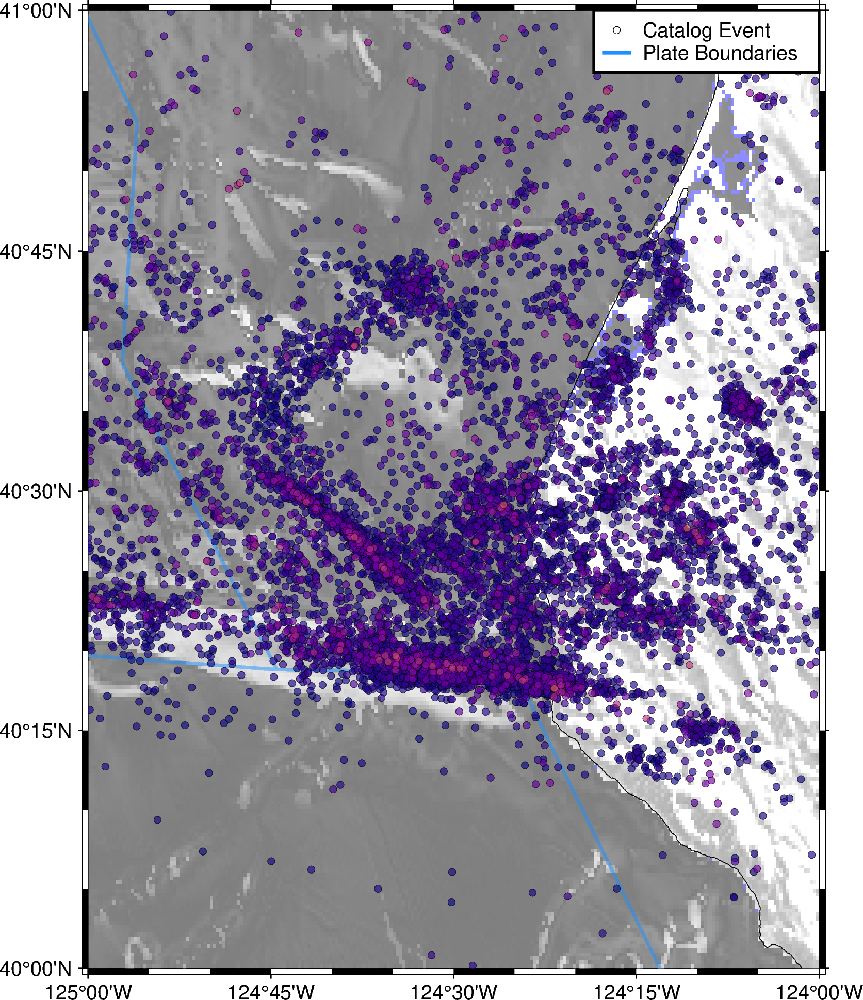

In [183]:


# Initialize the figure
fig = pygmt.Figure()

# Define target region
min_lat = 40
max_lat = 41
min_lon = -125
max_lon = -124


# Define the region to plot
region = [min_lon, max_lon, min_lat, max_lat]
title = "(b)"


# Load grid data
grid = pygmt.datasets.load_earth_relief(resolution="15s", region=[min_lon, max_lon, min_lat, max_lat])
shade = pygmt.grdgradient(grid=grid, azimuth="0/90", normalize="t1")

# Set up the base map
fig.basemap(region=region, projection="M12c", frame="af")

fig.grdimage(grid=grid, cmap="blue", shading=shade, transparency=50)
fig.coast(region=region, projection="M12c", shorelines=True, borders=[1, 2], resolution="f")

# Add plate boundaries 
fig.plot(data="PB2002_boundaries.dig", pen="1.5p,dodgerblue1", transparency=50)

# Apply logarithmic scale for color mapping
# Apply log10 transformation to nass values and set color palette
nass_log_min = _df['nass'].min()  # Add 1 to avoid log(0) error
nass_log_max = _df['nass'].max()
pygmt.makecpt(cmap="plasma", series=[nass_log_min, nass_log_max])
title = ""

# Plot the stations with the color map applied to the logarithm of "nass"
fig.plot(
    x=_df["lon"],
    y=_df["lat"],
    style="c0.12c",
    color=_df["nass"],  # Apply log transformation for color mapping
    cmap=True,
    pen="0.1p,black",
    transparency=35
)
# Plot a dummy objects for the legend
fig.plot(x=[-110], y=[48], style="c0.12c", color="white", label="Catalog Event", pen="0.2p,black")

fig.plot(
        x=[120, +120],
        y=[-30, -30],
        pen="1.5p,dodgerblue1",label='Plate Boundaries'
    )

fig.text(
    x=-125.25, y=40.36, text=title,
    font="25p,Helvetica-Bold,black",
    no_clip=True    # This prevents the text from being clipped
)

# # Add title text
# fig.colorbar(
#     position="jBC+o0.0c/0.25c+h+w8c/0.3c+ml",
#     box="+gwhite@30+p0.8p,black",
#     frame=["x+lNumber of P and S Picks"],
# )

# Add the legend to the plot
fig.legend(position="JTR+w3.7+jTR", box='+gwhite+p1p')
# Save the figure
fig.savefig("../data/datasets_all_regions/mendocino_events_zoomed_in_2010_2015_ver3_nass_no_relief.png")

# Display the figure
fig.show()


## Around 44.5N


plot [WARNING]: Mismatch between actual (1) and expected (2) fields near line 1684 in file PB2002_boundaries.dig
plot [WARNING]: Mismatch between actual (1) and expected (2) fields near line 5086 in file PB2002_boundaries.dig
plot [WARNING]: Mismatch between actual (1) and expected (2) fields near line 5113 in file PB2002_boundaries.dig
plot [WARNING]: Your data array row 17 contains NaNs - no resampling taken place!
/tmp/ipykernel_1122595/1107101657.py:36: FutureWarning: The 'color' parameter has been deprecated since v0.8.0 and will be removed in v0.12.0. Please use 'fill' instead.
  fig.plot(
/tmp/ipykernel_1122595/1107101657.py:46: FutureWarning: The 'color' parameter has been deprecated since v0.8.0 and will be removed in v0.12.0. Please use 'fill' instead.
  fig.plot(x=[-110], y=[48], style="c0.12c", color="white", label="Catalog Event", pen="0.2p,black")


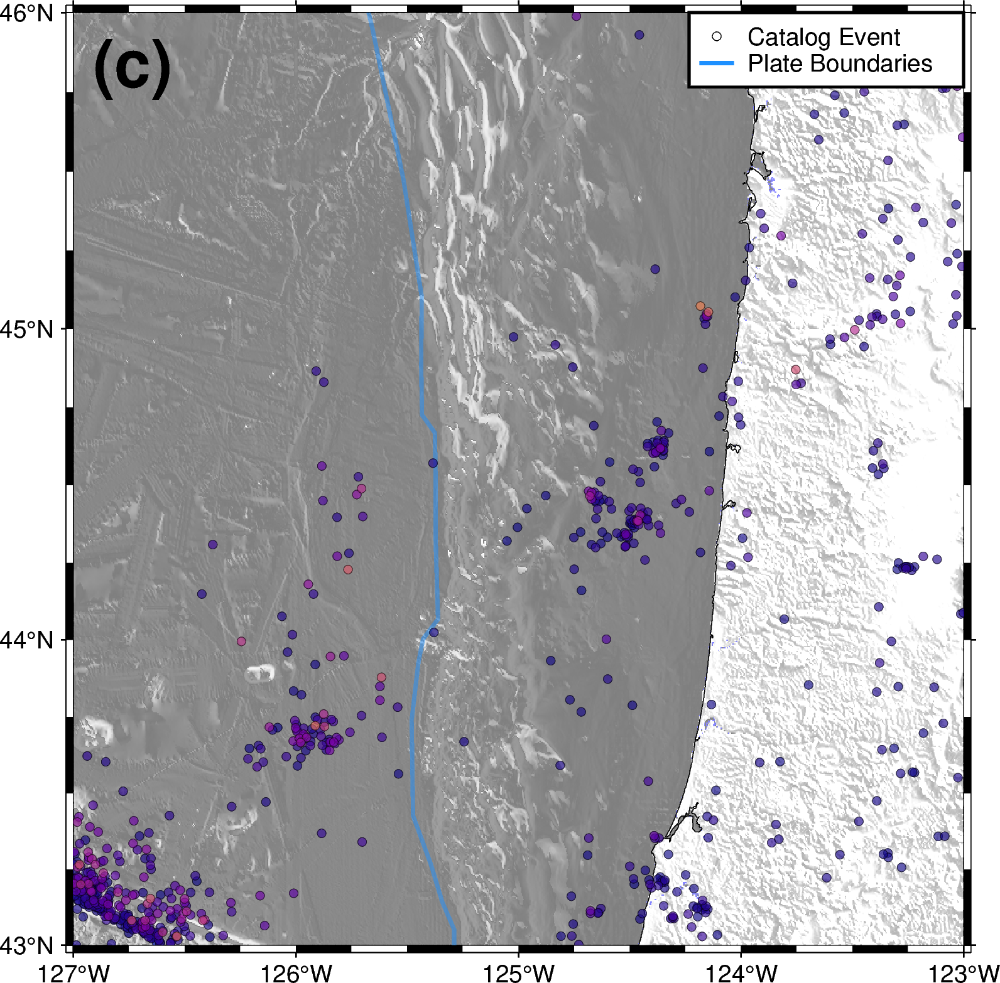

In [184]:


# Initialize the figure
fig = pygmt.Figure()

# Define target region
min_lat = 43
max_lat = 46
min_lon = -127
max_lon = -123

# Define the region to plot
region = [min_lon, max_lon, min_lat, max_lat]
title = "(b)"


# Load grid data
grid = pygmt.datasets.load_earth_relief(resolution="15s", region=[min_lon, max_lon, min_lat, max_lat])
shade = pygmt.grdgradient(grid=grid, azimuth="0/90", normalize="t1")

# Set up the base map
fig.basemap(region=region, projection="M12c", frame="af")

fig.grdimage(grid=grid, cmap="blue", shading=shade, transparency=50)
fig.coast(region=region, projection="M12c", shorelines=True, borders=[1, 2], resolution="f")

# Add plate boundaries 
fig.plot(data="PB2002_boundaries.dig", pen="1.5p,dodgerblue1", transparency=50)

# Apply logarithmic scale for color mapping
# Apply log10 transformation to nass values and set color palette
nass_log_min = _df['nass'].min()  # Add 1 to avoid log(0) error
nass_log_max = _df['nass'].max()
pygmt.makecpt(cmap="plasma", series=[nass_log_min, nass_log_max])
title = "(c)"

# Plot the stations with the color map applied to the logarithm of "nass"
fig.plot(
    x=_df["lon"],
    y=_df["lat"],
    style="c0.12c",
    color=_df["nass"],  # Apply log transformation for color mapping
    cmap=True,
    pen="0.1p,black",
    transparency=35
)
# Plot a dummy objects for the legend
fig.plot(x=[-110], y=[48], style="c0.12c", color="white", label="Catalog Event", pen="0.2p,black")

fig.plot(
        x=[120, +120],
        y=[-30, -30],
        pen="1.5p,dodgerblue1",label='Plate Boundaries'
    )

# Position the text 1.5 cm from the top left corner
fig.text(
    x=min_lon + (max_lon - min_lon) * (1 / 15),  # Adjust x based on 1.5 cm from left
    y=max_lat - (max_lat - min_lat) * (1 / 19),  # Adjust y based on 1.5 cm from top
    text=title,
    font="25p,Helvetica-Bold,black",
    no_clip=True
)

# # Add title text
# fig.colorbar(
#     position="jBC+o0.0c/0.25c+h+w8c/0.3c+ml",
#     box="+gwhite@30+p0.8p,black",
#     frame=["x+lNumber of P and S Picks"],
# )

# Add the legend to the plot
fig.legend(position="JTR+w3.7+jTR", box='+gwhite+p1p')
# Save the figure
fig.savefig("../data/datasets_all_regions/around_445_events_2010_2015_ver3_nass_no_relief.png")

# Display the figure
fig.show()


## Northern WA

plot [WARNING]: Mismatch between actual (1) and expected (2) fields near line 1684 in file PB2002_boundaries.dig
plot [WARNING]: Mismatch between actual (1) and expected (2) fields near line 5086 in file PB2002_boundaries.dig
plot [WARNING]: Mismatch between actual (1) and expected (2) fields near line 5113 in file PB2002_boundaries.dig
plot [WARNING]: Your data array row 17 contains NaNs - no resampling taken place!
/tmp/ipykernel_1122595/3697936454.py:33: FutureWarning: The 'color' parameter has been deprecated since v0.8.0 and will be removed in v0.12.0. Please use 'fill' instead.
  fig.plot(
/tmp/ipykernel_1122595/3697936454.py:44: FutureWarning: The 'color' parameter has been deprecated since v0.8.0 and will be removed in v0.12.0. Please use 'fill' instead.
  fig.plot(x=[-110], y=[48], style="c0.12c", color="white", label="Catalog Event", pen="0.2p,black")


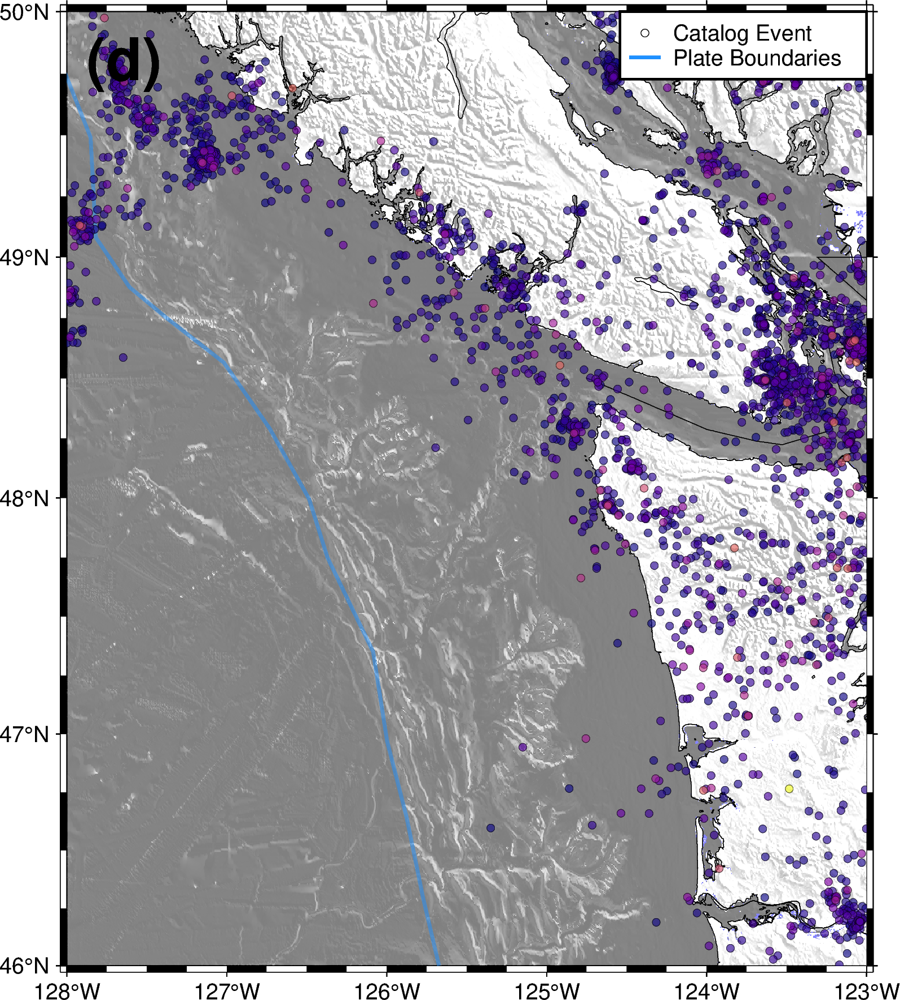

In [185]:
# Initialize the figure
fig = pygmt.Figure()

# Define target region
min_lat = 46
max_lat = 50
min_lon = -128
max_lon = -123

# Define the region to plot
region = [min_lon, max_lon, min_lat, max_lat]
title = "(d)"

# Load grid data
grid = pygmt.datasets.load_earth_relief(resolution="15s", region=[min_lon, max_lon, min_lat, max_lat])
shade = pygmt.grdgradient(grid=grid, azimuth="0/90", normalize="t1")

# Set up the base map
fig.basemap(region=region, projection="M12c", frame="af")

fig.grdimage(grid=grid, cmap="blue", shading=shade, transparency=50)
fig.coast(region=region, projection="M12c", shorelines=True, borders=[1, 2], resolution="f")

# Add plate boundaries 
fig.plot(data="PB2002_boundaries.dig", pen="1.5p,dodgerblue1", transparency=50)

# Apply logarithmic scale for color mapping
nass_log_min = _df['nass'].min()
nass_log_max = _df['nass'].max()
pygmt.makecpt(cmap="plasma", series=[nass_log_min, nass_log_max])

# Plot the stations with the color map applied to the logarithm of "nass"
fig.plot(
    x=_df["lon"],
    y=_df["lat"],
    style="c0.12c",
    color=_df["nass"],
    cmap=True,
    pen="0.1p,black",
    transparency=35
)

# Plot a dummy object for the legend
fig.plot(x=[-110], y=[48], style="c0.12c", color="white", label="Catalog Event", pen="0.2p,black")

fig.plot(
    x=[120, +120],
    y=[-30, -30],
    pen="1.5p,dodgerblue1", label='Plate Boundaries'
)

# Position the text 1.5 cm from the top left corner
fig.text(
    x=min_lon + (max_lon - min_lon) * (1 / 14),  # Adjust x based on 1.5 cm from left
    y=max_lat - (max_lat - min_lat) * (1 / 21),  # Adjust y based on 1.5 cm from top
    text=title,
    font="25p,Helvetica-Bold,black",
    no_clip=True
)

# Add the legend to the plot
fig.legend(position="JTR+w3.7+jTR", box='+gwhite+p1p')

# Save the figure
fig.savefig("../data/datasets_all_regions/northern_wa_events_2010_2015_ver3_nass_no_relief.png")

# Display the figure
fig.show()

## Plot the colorbar

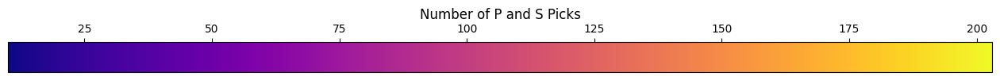

In [203]:
# Create a figure for the color bar
fig, ax = plt.subplots(figsize=(16, 1))  # Adjust the size as needed
fig.subplots_adjust(bottom=0.5)

# Define the normalization range and colormap
norm = mcolors.Normalize(vmin=min_nass, vmax=max_nass)
cmap = cm.plasma  # Use the same colormap as in the previous plots

# Create the color bar
cbar = fig.colorbar(cm.ScalarMappable(norm=norm, cmap=cmap), cax=ax, orientation='horizontal')

# Set the color bar label
cbar.set_label('Number of P and S Picks', fontsize=12)

# Move the ticks and labels above the color bar
cbar.ax.xaxis.set_ticks_position('top')  # Move ticks to the top
cbar.ax.xaxis.set_label_position('top')  # Move the label to the top

# Save the color bar as a PNG
fig.savefig("colorbar.png", dpi=300, bbox_inches='tight')

# Display the color bar
plt.show()